In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
import torch
import torchsde

from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP6dim, SpectralNormMLP

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [4]:
from fab.target_distributions.many_well import ManyWellEnergy

dim = 6 # Can increase in to higher values that are multiples of two.
seed = 0
target = ManyWellEnergy(dim, a=-0.5, b=-6, use_gpu=True)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1695391884920/work/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [5]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/_tensor.py:738: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at /opt/conda/conda-bld/pytorch_1695391884920/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(


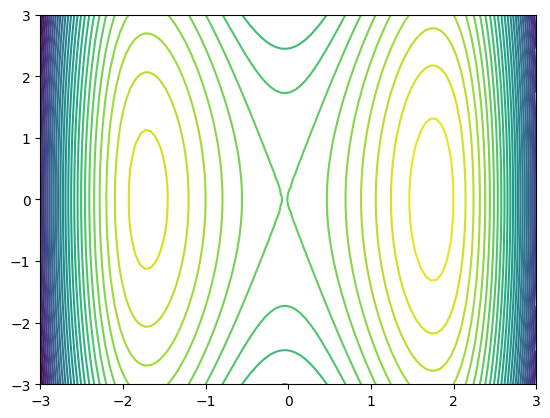

In [6]:
# plot the contours for the marginal distribution of the first 2D of target (i.e. the Double Well Problem).
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-3, 3)
plot_contours(target.log_prob_2D, bounds=plotting_bounds, n_contour_levels=40, ax=ax, grid_width_n_points=100)
if torch.cuda.is_available():
    target.to("cuda")

In [45]:
def plot_dataset(samples, gen_samples=None, dim=dim):
    target.to("cpu")
    n_rows = dim // 2
    fig, axs = plt.subplots(dim // 2, 2,  sharex=True, sharey=True, figsize=(10, n_rows*3))

    for i in range(n_rows):
        plot_contours(target.log_prob_2D, bounds=plotting_bounds, ax=axs[i, 0], n_contour_levels=40)

        # plot flow samples
        plot_marginal_pair(samples, ax=axs[i, 0], bounds=plotting_bounds, marginal_dims=(i*2,i*2+1))
        axs[i, 0].set_xlabel(f"dim {i*2}")
        axs[i, 0].set_ylabel(f"dim {i*2 + 1}")


        if gen_samples is not None:
            plot_contours(target.log_prob_2D, bounds=plotting_bounds, ax=axs[i, 1], 
                        n_contour_levels=40)
            # plot generated samples
            plot_marginal_pair(gen_samples, ax=axs[i, 1], bounds=plotting_bounds, marginal_dims=(i*2,i*2+1))
            axs[i, 1].set_xlabel(f"dim {i*2}")
            axs[i, 1].set_ylabel(f"dim {i*2 + 1}")
        else:
            #delete subplot
            fig.delaxes(axs[i, 1])
        plt.tight_layout()
    
    axs[0, 0].set_title("Dataset")
    axs[0, 1].set_title("Generated samples")
    plt.show()
    return [fig]

In [9]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''
    mins = -3
    maxs = 3
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

### Dataset

In [10]:
# normalize the dataset
init_num_samples = 2048
#unnorm_init_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -3
global_maxs_init = 3

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

In [11]:
unnorm_init_samples.shape

torch.Size([2048, 6])

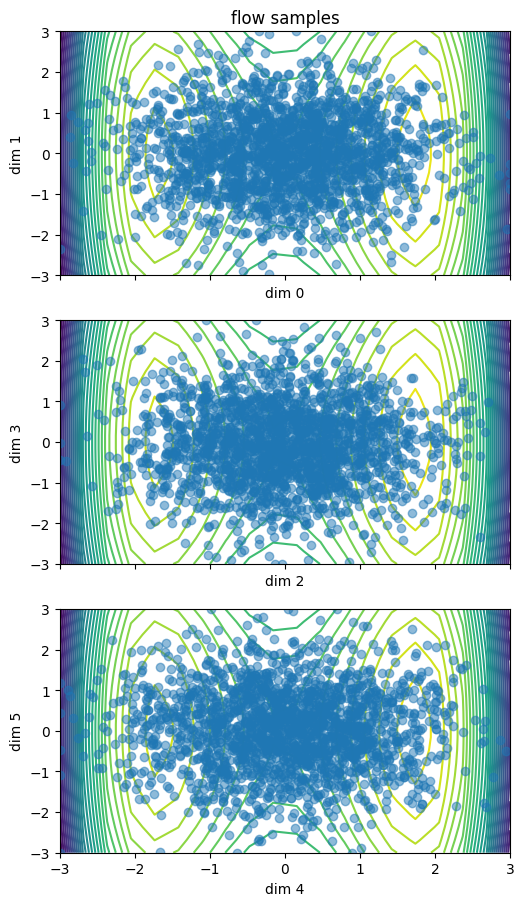

In [12]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### Networks

In [28]:
beta = 1
vectorfield = MyMLP6dim().to(device)
# reward_model = SpectralNormMLP().to(device)

# diffusion = GaussianDiffusion(
#     model,
#     image_size = 2,
#     timesteps = 1000,          # number of steps
#     auto_normalize= False      # data is already normalized, output will be in range [-1, 1]
# ).to(device)

In [29]:
# opt_diffusion = Adam(diffusion.parameters())
opt_vectorfield = Adam(vectorfield.parameters())

In [30]:
buffer = SimpleBuffer(dim, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, sample_with_replacement=True)
buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


In [31]:
def reward_matching_loss_dumb(target, vectorfield, constant_noise_scale, global_mins, global_maxs, x, t):     
    t = t.unsqueeze(1)
    noise = constant_noise_scale * t
    # pdb.set_trace()
    x.requires_grad = True
    samples = torch.normal(x, noise ** 0.5)
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs))
    estimated_scores = torch.autograd.grad(samples_energy.sum(), samples, retain_graph=True)[0]
    pred_scores = vectorfield(samples, t.squeeze())
    
    return (estimated_scores - pred_scores).pow(2).mean()

In [49]:
def reward_matching_loss(target, vectorfield, constant_noise_scale, global_mins, global_maxs, x, t):     
    t = t.unsqueeze(1)
    noise = constant_noise_scale * t
    # pdb.set_trace()
    x.requires_grad = True

    # noisy sample for exploration
    noisy_x = torch.normal(x, noise ** 0.5)
    pred_scores = vectorfield(noisy_x, t.squeeze())
    
    noisy_x_expanded = noisy_x.unsqueeze(1).expand(-1, 100, -1)
    noisy_x_prime = torch.normal(noisy_x_expanded, noise ** 0.5)
    samples_energy = target.log_prob(unnormalize(noisy_x_prime, global_mins, global_maxs))
    estimated_scores = torch.autograd.grad(samples_energy.sum(), noisy_x_prime, retain_graph=True)[0]
    
    return (estimated_scores - pred_scores).pow(2).mean()

In [33]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score_net):
        super().__init__()
        self.score_model = score_net
    
    def f(self, t, x):
        # pdb.set_trace()
        t = t.repeat(len(x)).to(x.device)
        score = self.score_model(x, 1-t)
        return self.g(t, x).pow(2) * score 
    
    def g(self, t, x):
        return torch.full_like(x, beta ** 0.5)

In [34]:
def generate_samples(ve_reverse_sde, dim):
    num_samples = 400
    target_sigma_squared = 0.0
    # x1 = torch.normal(torch.zeros((num_samples, 2)), torch.full((num_samples, 2), 
    # (target_sigma_squared + beta) ** 0.5)).to(device)
    x1 = torch.normal(torch.zeros((num_samples, dim)), torch.full((num_samples, dim), 
                                                                (target_sigma_squared + beta) ** 0.5)).to(device)
    t = torch.linspace(0.0, 1.0, 500)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x1, t)
    return samples

### Training Loop

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 0 | Loss 136652.421875
Epoch 49 | Loss 15491.097656
Epoch 98 | Loss 3095.460938
Epoch 147 | Loss 1314.841064
Epoch 196 | Loss 876.911133
Epoch 245 | Loss 1515.154297
Epoch 294 | Loss 642.600525


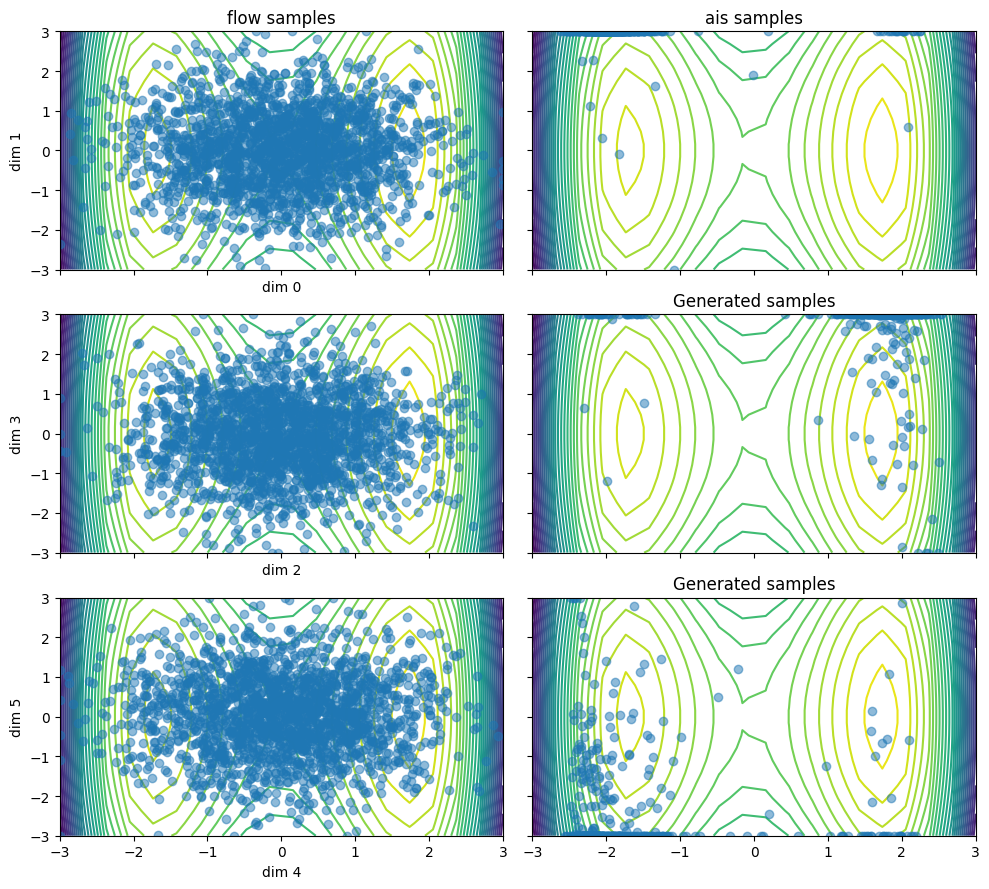

 10%|█         | 1/10 [00:48<07:20, 48.98s/it]

Epoch 0 | Loss 9184.390625
Epoch 49 | Loss 8767.633789
Epoch 98 | Loss 832.933350
Epoch 147 | Loss 1154.306885
Epoch 196 | Loss 3702.891846
Epoch 245 | Loss 358.648285
Epoch 294 | Loss 1026.965210


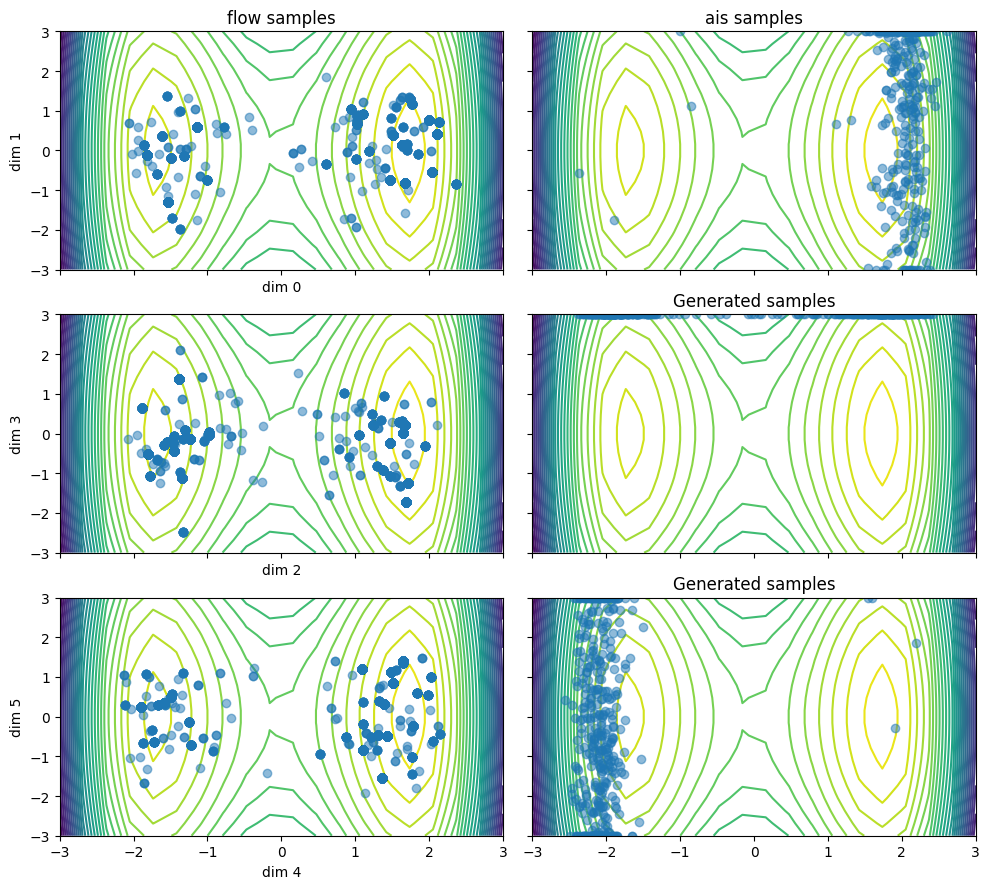

 20%|██        | 2/10 [02:07<08:49, 66.13s/it]

Epoch 0 | Loss 1605.775513
Epoch 49 | Loss 1900.170898
Epoch 98 | Loss 282.275482
Epoch 147 | Loss 500.252350
Epoch 196 | Loss 1166.522095
Epoch 245 | Loss 157.338776
Epoch 294 | Loss 3245.437256


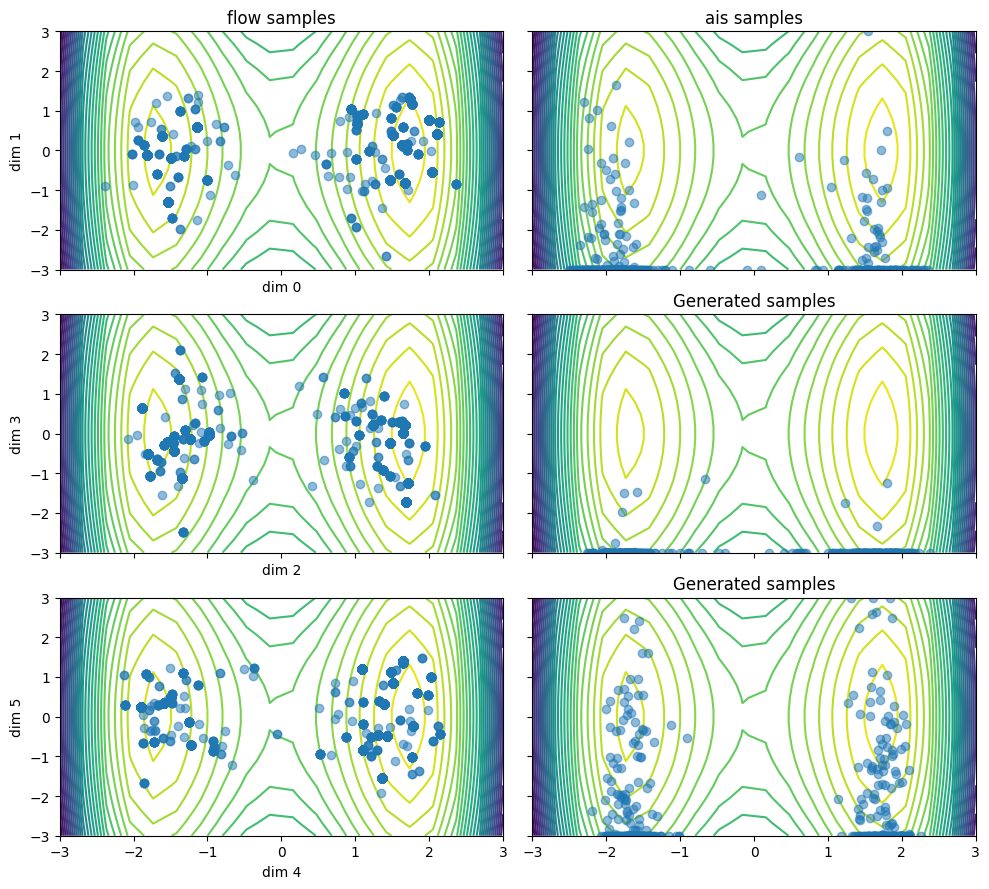

 30%|███       | 3/10 [03:21<08:09, 69.94s/it]

Epoch 0 | Loss 368.348999
Epoch 49 | Loss 1072.719604
Epoch 98 | Loss 116.352074
Epoch 147 | Loss 2198.305908
Epoch 196 | Loss 1434.975098
Epoch 245 | Loss 2006.610962
Epoch 294 | Loss 676.697815


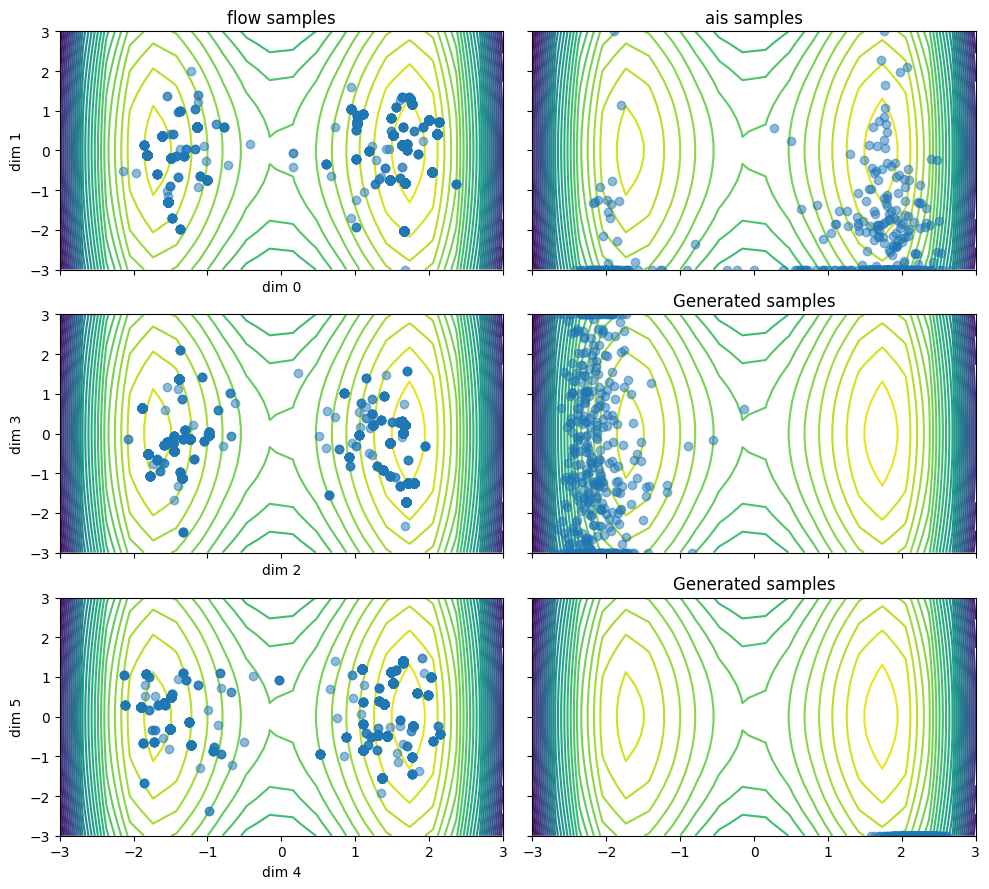

 40%|████      | 4/10 [04:42<07:26, 74.33s/it]

Epoch 0 | Loss 827.219971
Epoch 49 | Loss 3424.189697
Epoch 98 | Loss 4913.146484
Epoch 147 | Loss 1384.330933
Epoch 196 | Loss 481.700928
Epoch 245 | Loss 679.383911
Epoch 294 | Loss 601.565979


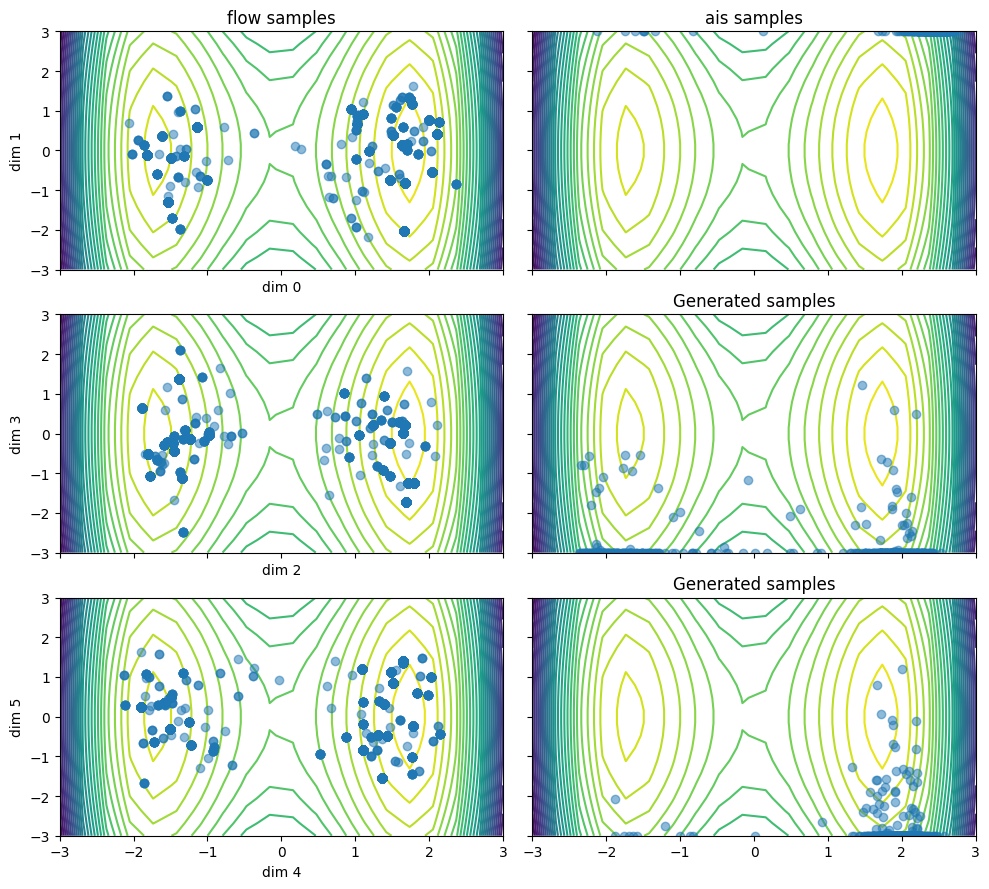

 50%|█████     | 5/10 [06:07<06:30, 78.10s/it]

Epoch 0 | Loss 149.908249
Epoch 49 | Loss 371.710724
Epoch 98 | Loss 4264.722656
Epoch 147 | Loss 277.192993
Epoch 196 | Loss 294.149872
Epoch 245 | Loss 276.712891
Epoch 294 | Loss 39947.257812


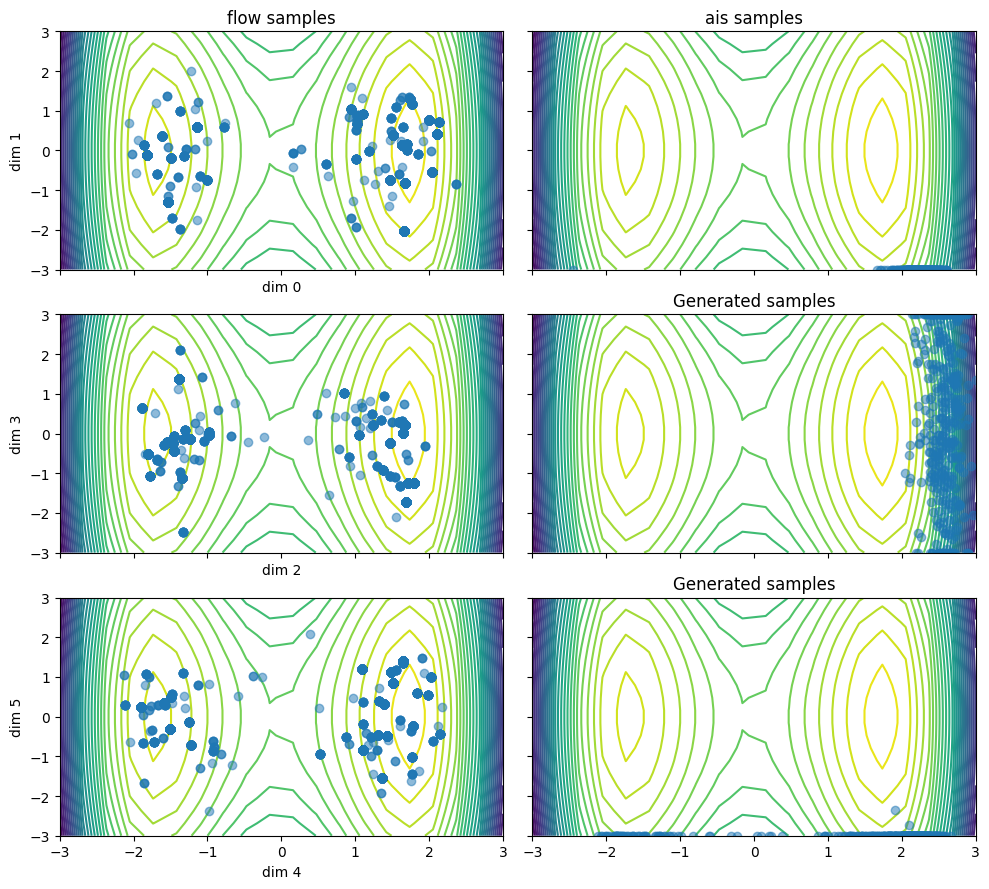

 60%|██████    | 6/10 [07:23<05:09, 77.49s/it]

Epoch 0 | Loss 409.482544
Epoch 49 | Loss 2755.628906
Epoch 98 | Loss 289.378204
Epoch 147 | Loss 508.581818
Epoch 196 | Loss 320.324310
Epoch 245 | Loss 537.599426
Epoch 294 | Loss 120.752380


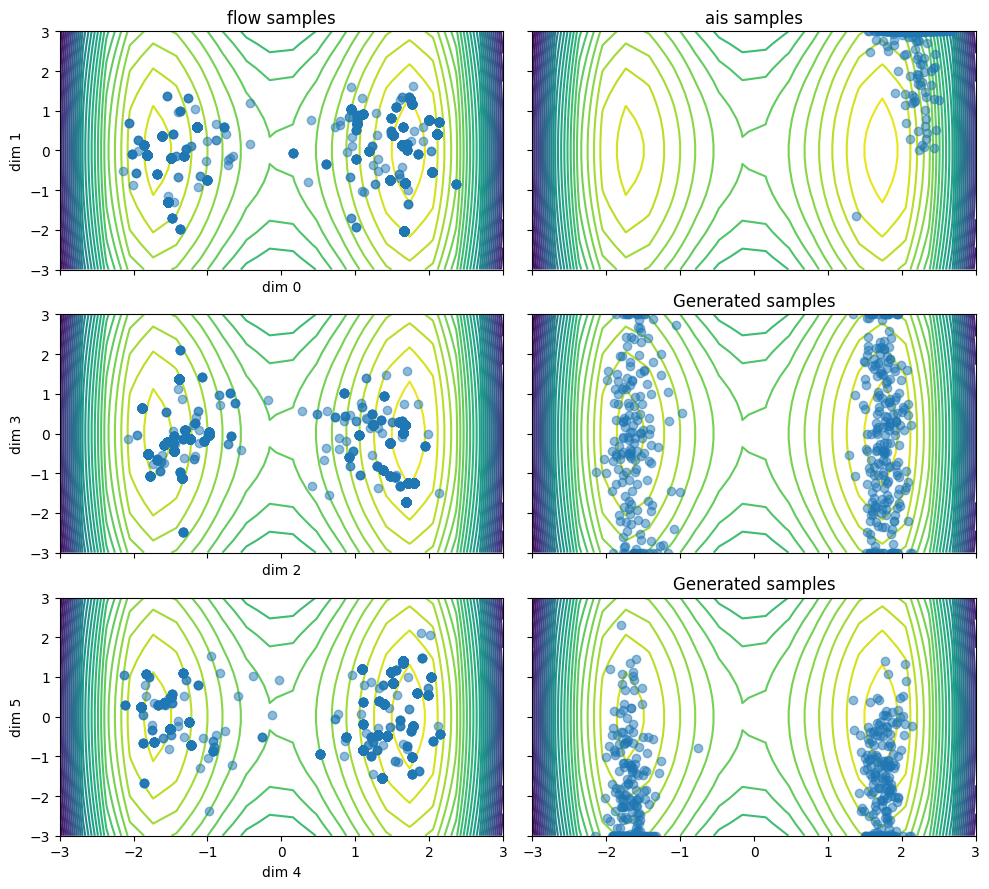

 70%|███████   | 7/10 [08:38<03:49, 76.50s/it]

Epoch 0 | Loss 162.761612
Epoch 49 | Loss 1276.248657
Epoch 98 | Loss 3645.435303
Epoch 147 | Loss 1130.265869
Epoch 196 | Loss 3434.843750
Epoch 245 | Loss 141.906891
Epoch 294 | Loss 3821.353760


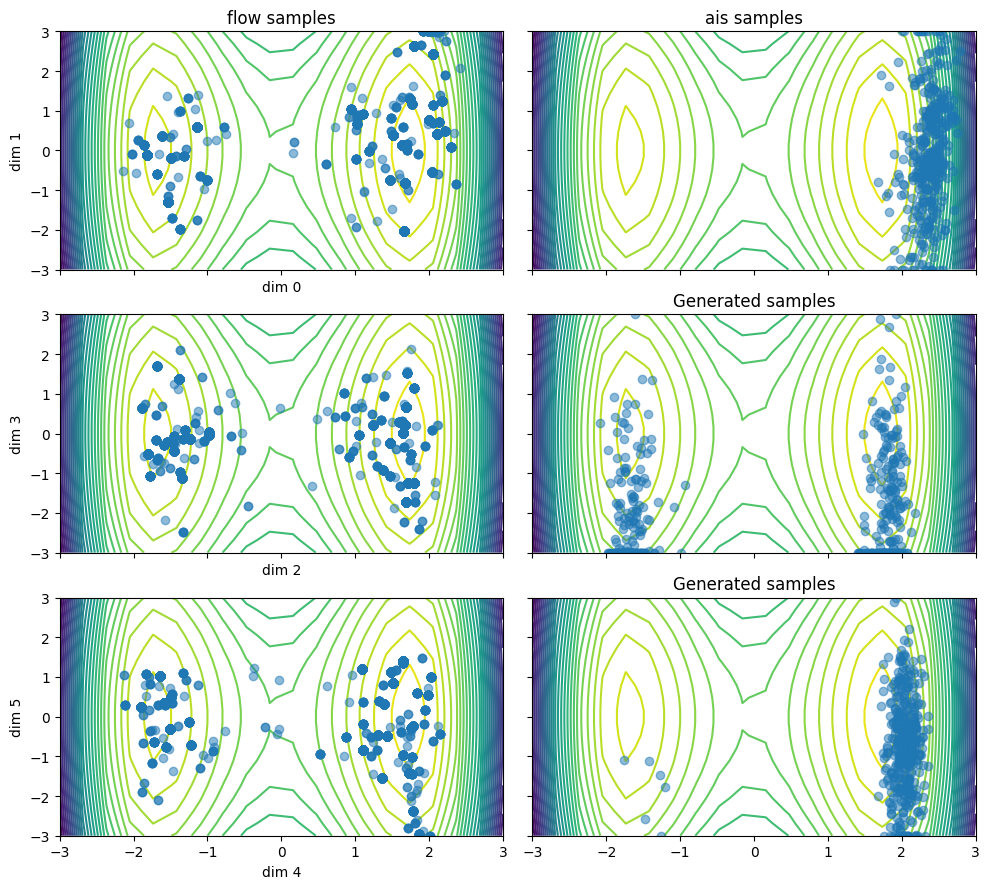

 80%|████████  | 8/10 [09:55<02:33, 76.81s/it]

Epoch 0 | Loss 1061.363647
Epoch 49 | Loss 247.036606
Epoch 98 | Loss 227.351395
Epoch 147 | Loss 631.411072
Epoch 196 | Loss 199.069214
Epoch 245 | Loss 195.891724
Epoch 294 | Loss 244.764328


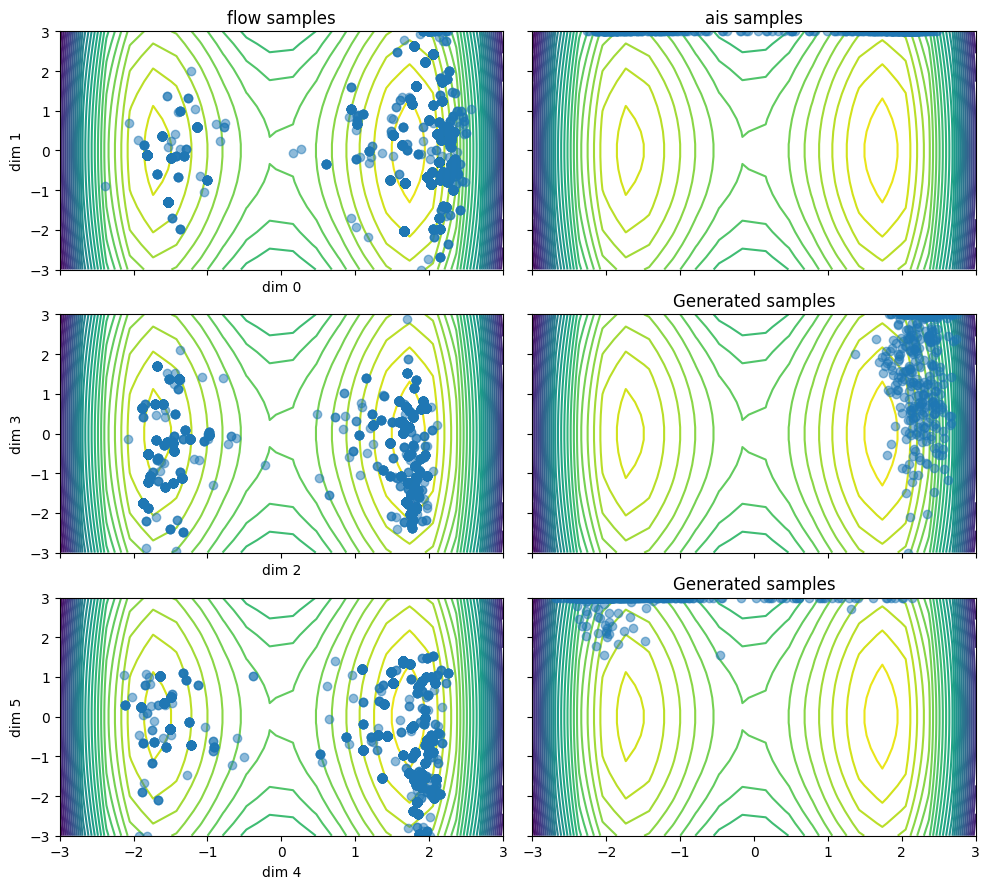

 90%|█████████ | 9/10 [11:14<01:17, 77.40s/it]

Epoch 0 | Loss 573.894958
Epoch 49 | Loss 226.359985
Epoch 98 | Loss 46.734055
Epoch 147 | Loss 1555.427246
Epoch 196 | Loss 135.346085
Epoch 245 | Loss 45213.183594
Epoch 294 | Loss 1243.155640


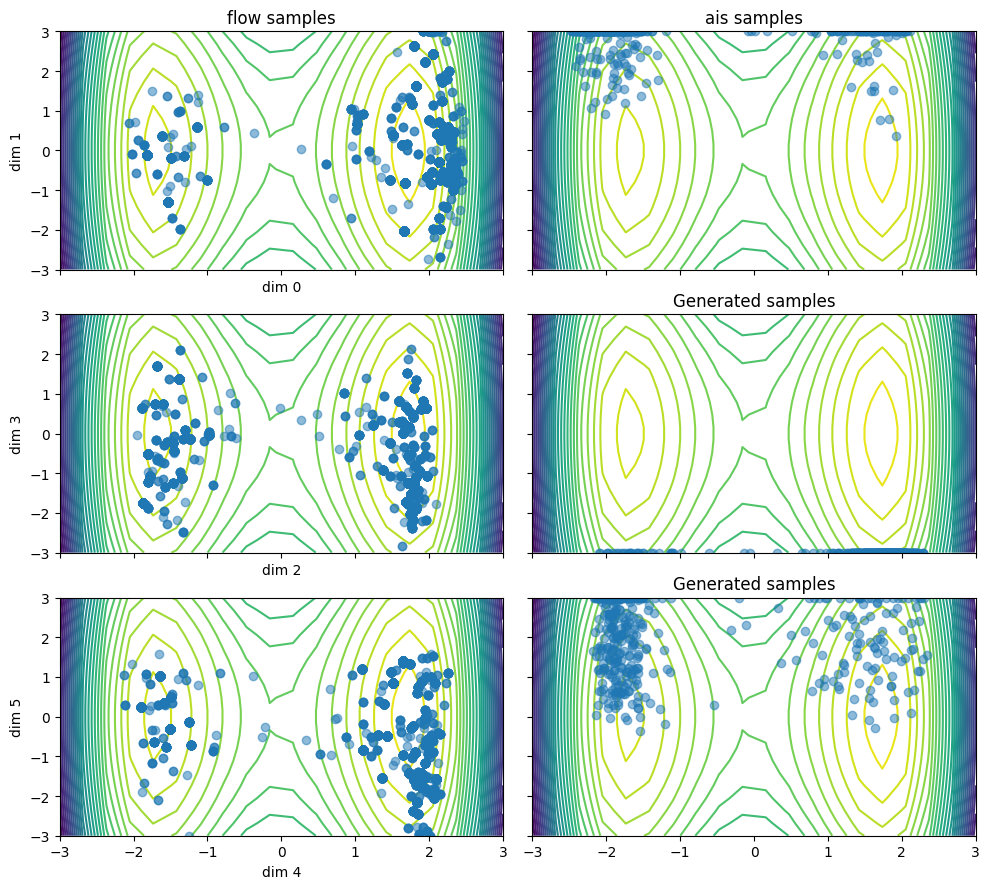

100%|██████████| 10/10 [12:33<00:00, 75.33s/it]


In [35]:
outer_epochs= 10
inner_epochs = 300

num_samples = 2048

train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init
ve_reverse_sde = VEReverseSDE(vectorfield).to(device)

for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()
            t = torch.rand(len(samples), device=device)
            loss = reward_matching_loss_dumb(target, vectorfield, 1, global_mins, global_maxs, samples, t)
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))

    # Sample
    samples = generate_samples(ve_reverse_sde, dim=6)[-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

    # Update Buffer 
    buffer.add(samples, samples_energy)

    plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                 unnormalize(samples, global_mins, global_maxs))
    plt.show()
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

### Sampling

In [39]:
samples = generate_samples(ve_reverse_sde, dim=6)[-1]

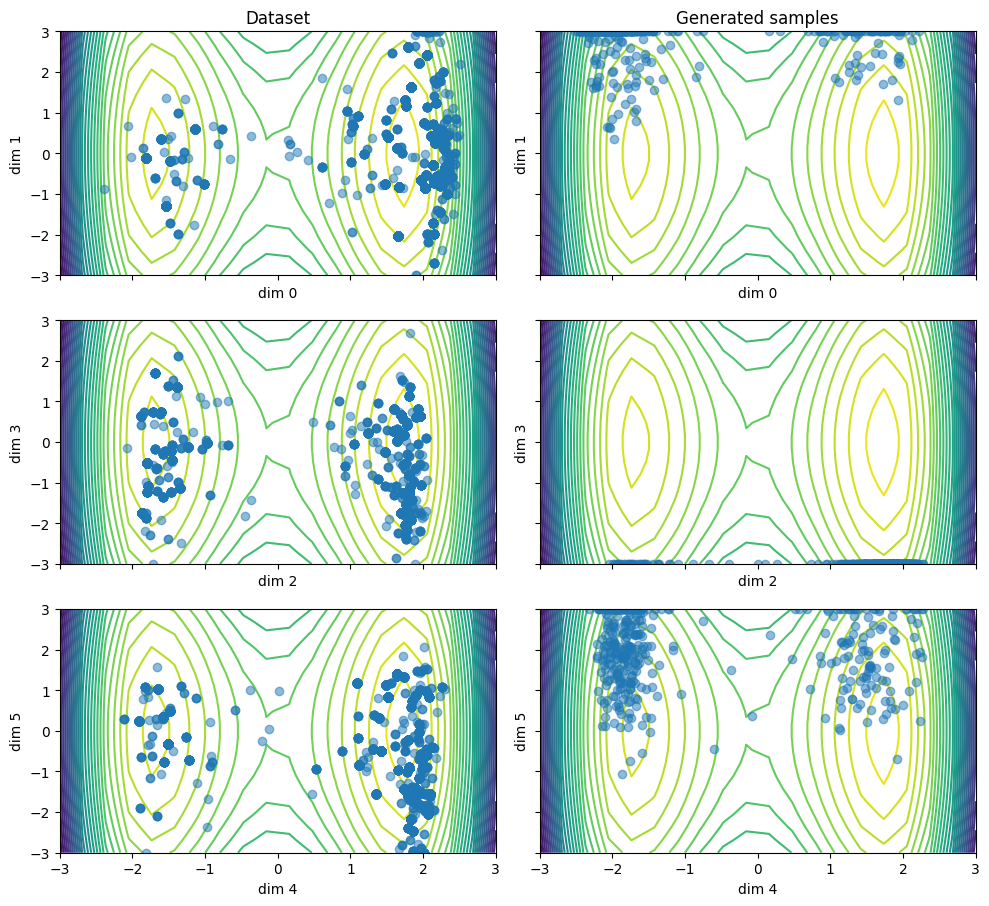

[<Figure size 1000x900 with 6 Axes>]

In [46]:
plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
             unnormalize(samples, global_mins, global_maxs))
